# Installing Dependencies

**So here in this scenario of autonomus car driving we need to use the box2d of the OpenAi Gym,so for installing those depenendencies we have to write the following conda/pip installs as mentioned below,as we will be working in 2D environment we need to install the box2d,so below is the code for installing it ↓**

In [ ]:
# if you're working on anaconda prompt,then directly install these on you're conda console,or you can simply install
# them using the jupyter notebook by simply adding the "!pip install box2d",and "!pip install swig" if working from jupyter!


#conda install swig

#pip install box2d

# Import Dependencies

In [1]:
import gym 
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import VecFrameStack,DummyVecEnv
from stable_baselines3.common.evaluation import evaluate_policy
import os

# Test Environment

In [2]:
envname = "CarRacing-v0"
env = gym.make(envname)

C:\Users\meet\anaconda3\envs\tensorflow_ennv\lib\site-packages\gym\logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


In [4]:
env.action_space

Box(-1.0, 1.0, (3,), float32)

In [5]:
env.observation_space

Box(0, 255, (96, 96, 3), uint8)

In [3]:
episodes = 2
for episode in range(1,episodes+1):
    state = env.reset()
    done = False
    score = 0
    while not done:
        env.render()
        action = env.action_space.sample()
        n_state,reward,done,info = env.step(action)
        score+=reward
        
    print(f'Episode : {episode},score:{score}')
    
env.close()

Track generation: 1131..1424 -> 293-tiles track


C:\Users\meet\anaconda3\envs\tensorflow_ennv\lib\site-packages\pyglet\image\codecs\wic.py:289: UserWarning: [WinError -2147417850] Cannot change thread mode after it is set
  warnings.warn(str(err))


Episode : 1,score:-31.506849315068994
Track generation: 1063..1346 -> 283-tiles track
Episode : 2,score:-29.078014184397592


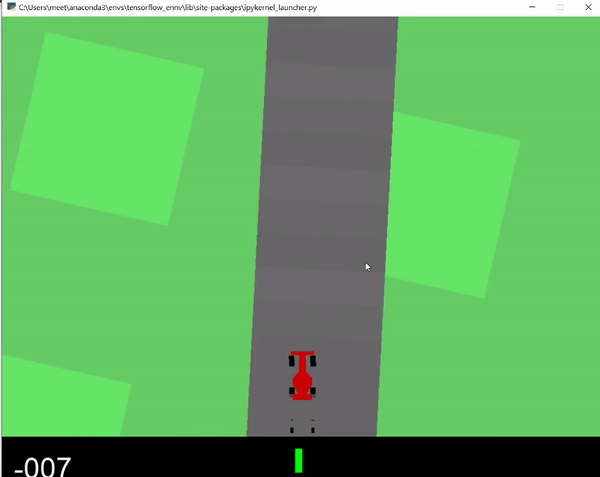

**So as we can observe from the action space that we're having a `Box` space and in the observation space that we're having the `RGB` image,so here we will be again using the `CNN` model Policy and the algorithm from the algo chart we'll be using the `PPO` algo and the policy used will be the `CNNPolicy` as we're dealing with RGB images!**

# Train Model

In [10]:
log_path = os.path.join("Training",'Logs')
model = PPO('CnnPolicy',env,verbose = 1,tensorboard_log=log_path)
model.learn(total_timesteps = 40000)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.
Track generation: 967..1212 -> 245-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1345..1693 -> 348-tiles track
Logging to Training\Logs\PPO_8
Track generation: 1110..1391 -> 281-tiles track
Track generation: 1187..1488 -> 301-tiles track
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 1e+03    |
|    ep_rew_mean     | -54.5    |
| time/              |          |
|    fps             | 111      |
|    iterations      | 1        |
|    time_elapsed    | 18       |
|    total_timesteps | 2048     |
---------------------------------
Track generation: 1139..1428 -> 289-tiles track
Track generation: 1140..1429 -> 289-tiles track
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 1e+03        

Track generation: 1163..1458 -> 295-tiles track
Track generation: 1030..1292 -> 262-tiles track
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1e+03       |
|    ep_rew_mean          | -45         |
| time/                   |             |
|    fps                  | 24          |
|    iterations           | 9           |
|    time_elapsed         | 760         |
|    total_timesteps      | 18432       |
| train/                  |             |
|    approx_kl            | 0.013630267 |
|    clip_fraction        | 0.196       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.09       |
|    explained_variance   | -0.482      |
|    learning_rate        | 0.0003      |
|    loss                 | -0.0202     |
|    n_updates            | 80          |
|    policy_gradient_loss | -0.0303     |
|    std                  | 0.937       |
|    value_loss           | 0.264       |
----------------------

Track generation: 1013..1276 -> 263-tiles track
Track generation: 1104..1392 -> 288-tiles track
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1e+03       |
|    ep_rew_mean          | -41.1       |
| time/                   |             |
|    fps                  | 23          |
|    iterations           | 18          |
|    time_elapsed         | 1583        |
|    total_timesteps      | 36864       |
| train/                  |             |
|    approx_kl            | 0.050956115 |
|    clip_fraction        | 0.34        |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.76       |
|    explained_variance   | 0.664       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.00293     |
|    n_updates            | 170         |
|    policy_gradient_loss | -0.0419     |
|    std                  | 0.844       |
|    value_loss           | 0.307       |
----------------------

**All the same as we have done in case of previous environments,inorder to monitor our training and validation metrics we save out our logs,and then we can monitor our logs on the tensorboard platform by running the `tensorboard --logdir=<log_directory>`,here log_directory is the one where you have saved you're training and validation logs,one can browse out from there!,this will open the `localhost:6000`,where one can browse through!,then we train our model for 10000 time steps,for more robust model you can increase you're training time to a 1M or even more!**

# Save Model

In [11]:
ppo_path = os.path.join('Training','Saved Models','PPO_Driving_model')
model.save(ppo_path)

# Evaluate and Test Model

In [12]:
evaluate_policy(model,env,n_eval_episodes = 10,render = True)
env.close()

C:\Users\meet\anaconda3\envs\tensorflow_ennv\lib\site-packages\stable_baselines3\common\evaluation.py:69: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  UserWarning,


Track generation: 1152..1444 -> 292-tiles track
Track generation: 1015..1278 -> 263-tiles track
Track generation: 976..1224 -> 248-tiles track
Track generation: 1144..1434 -> 290-tiles track
Track generation: 1255..1573 -> 318-tiles track
Track generation: 1005..1268 -> 263-tiles track
Track generation: 1025..1288 -> 263-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1142..1432 -> 290-tiles track
Track generation: 1117..1406 -> 289-tiles track
Track generation: 1171..1468 -> 297-tiles track
Track generation: 1061..1335 -> 274-tiles track


In [9]:
## Testing the model,where it tries to predict it's own actions

episodes = 3
for episode in range(1,episodes+1):
    obs = env.reset()
    done = False
    score = 0
    while not done:
        env.render()
        actions,_ = model.predict(obs)
        obs,reward,done,info = env.step(actions)
        score+=reward
        
    print(f' Episode : {episode},Score : {score}')
    
env.close()

Track generation: 1165..1460 -> 295-tiles track
 Episode : 1,Score : -38.77551020408213
Track generation: 1284..1609 -> 325-tiles track
 Episode : 2,Score : -47.5308641975313
Track generation: 1236..1549 -> 313-tiles track
 Episode : 3,Score : -64.74358974359028


# Model Result when Steps Trained = 10,000

**As we can see that if we run the car for `10000` iterations,then the agent has learnt almost nothing,as we can see from the image below it makes it clear that this agent requires more time to learn the environment,other possible hack is may be one can use different policies,that also works fine,so this was the result when the agent was trained for 10000 iterations**

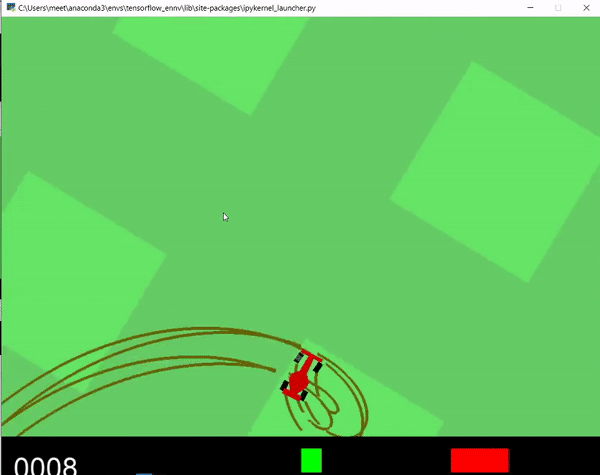

# Model Result when steps Trained = 40,000

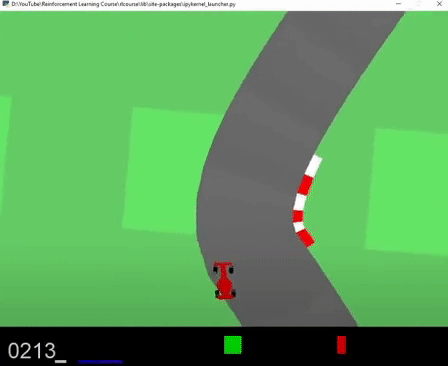